# San Francisco Rental Prices Dashboard

In this notebook, you will compile the visualizations from the previous analysis into functions that can be used for a Panel dashboard.

In [1]:
# imports
import panel as pn
pn.extension('plotly')
import plotly.express as px
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import os
from pathlib import Path
from dotenv import load_dotenv
import csv
import param

In [2]:
pip install panel

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Read the Mapbox API key
load_dotenv()
#map_box_api = os.getenv("MAPBOX_API_KEY")
map_box_api = "pk.eyJ1IjoieXZldHRlbHkiLCJhIjoiY2tvbm5kMGRlMDJsNTJvcXJ4MTcwNnpwNSJ9.6rdwcr8O-WKZRt9CIltOBg"
px.set_mapbox_access_token(map_box_api)

# Import Data

In [4]:
# Import the necessary CSVs to Pandas DataFrames
file_path = Path("Data/sfo_neighborhoods_census_data.csv")
sfo_data = pd.read_csv(file_path, index_col="year")

file_path_2 = Path("Data/neighborhoods_coordinates.csv")
df_neighborhood_locations = pd.read_csv(file_path_2)

file_path_3 = Path("SFO_Data_Grp.csv")
sf_data_grp = pd.read_csv(file_path_3)


- - -

## Panel Visualizations

In this section, you will copy the code for each plot type from your analysis notebook and place it into separate functions that Panel can use to create panes for the dashboard. 

These functions will convert the plot object to a Panel pane.

Be sure to include any DataFrame transformation/manipulation code required along with the plotting code.

Return a Panel pane object from each function that can be used to build the dashboard.

Note: Remove any `.show()` lines from the code. We want to return the plots instead of showing them. The Panel dashboard will then display the plots.

In [19]:
# Define Panel Visualization Functions
def housing_units_per_year():
    """Housing Units Per Year."""
    housing_units_per_year = sfo_data['housing_units'].groupby('year').mean()
    housing_units_per_year.plot(kind='bar', title="Housing Units in San Francisco from 2010 to 2016")
    plt.ylim(ymax= 387500, ymin = 370000)
    return housing_units_per_year

def average_gross_rent():
    """Average Gross Rent in San Francisco Per Year."""
    average_gross_rent = sfo_data.groupby(['year'])['gross_rent'].mean().plot(kind='line', title='Average Gross Rent by Year', color='red')
    return average_gross_rent

def average_sales_price():
    """Average Sales Price Per Year."""
    average_sales_price = sfo_data.groupby(['year'])['sale_price_sqr_foot'].mean().plot(kind='line', title='Average Price per Square Foot by Year', color='purple')
    return average_sales_price

def average_price_by_neighborhood():
    """Average Prices by Neighborhood."""
    average_price_by_neighborhood = sfo_data.groupby(['year', 'neighborhood']).mean().reset_index().drop(columns=['housing_units', 'gross_rent'])
    average_price_by_neighborhood.hvplot.line(x='year', y='sale_price_sqr_foot', groupby='neighborhood')
    return average_price_by_neighborhood

def top_most_expensive_neighborhoods():
    """Top 10 Most Expensive Neighborhoods."""
    ave_by_neighborhood =  sfo_data.groupby(['neighborhood']).mean().reset_index()
    top_most_expensive_neighborhoods = ave_by_neighborhood.sort_values('sale_price_sqr_foot', ascending=False).head(10)
    top_most_expensive_neighborhoods.hvplot.bar(title="Top 10 Expensive Neighborhoods in SFO", x="neighborhood", y="sale_price_sqr_foot", rot=90)
    return top_most_expensive_neighborhoods

def most_expensive_neighborhoods_rent_sales():
    """Comparison of Rent and Sales Prices of Most Expensive Neighborhoods."""  
    ave_by_year_neighborhood = sfo_data.groupby(['year', 'neighborhood']).mean().reset_index()
    most_expensive_neighborhoods_rent_sales = ave_by_year_neighborhood.hvplot.bar(x="year", y= ["sale_price_sqr_foot", "gross_rent"],groupby="neighborhood",width= 600, rot=90, color=["orange", "blue"], title="Comparison of Cost to Purchase versus Rental Income")
    return most_expensive_neighborhoods_rent_sales

def parallel_coordinates():
    """Parallel Coordinates Plot."""
    ave_by_year_neighborhood = sfo_data.groupby(['year', 'neighborhood']).mean().reset_index()
    ave_by_neighborhood =  sfo_data.groupby(['neighborhood']).mean().reset_index()
    expensive_neighborhoods = ave_by_neighborhood.sort_values('sale_price_sqr_foot', ascending=False).head(10)
    df_expensive_neighborhoods_per_year = ave_by_year_neighborhood[ave_by_year_neighborhood["neighborhood"].isin(expensive_neighborhoods["neighborhood"])]
    px.parallel_coordinates(df_expensive_neighborhoods_per_year, color='sale_price_sqr_foot')
    return parallel_coordinates


def parallel_categories():
    """Parallel Categories Plot."""
    ave_by_year_neighborhood = sfo_data.groupby(['year', 'neighborhood']).mean().reset_index()
    ave_by_neighborhood =  sfo_data.groupby(['neighborhood']).mean().reset_index()
    expensive_neighborhoods = ave_by_neighborhood.sort_values('sale_price_sqr_foot', ascending=False).head(10)
    df_expensive_neighborhoods_per_year = ave_by_year_neighborhood[ave_by_year_neighborhood["neighborhood"].isin(expensive_neighborhoods["neighborhood"])]
    px.parallel_categories(
        df_expensive_neighborhoods_per_year,
        dimensions = ['neighborhood', 'sale_price_sqr_foot', 'housing_units', 'gross_rent'],
        color = 'sale_price_sqr_foot',
        color_continuous_scale=px.colors.sequential.Inferno,
    )
    return parallel_categories


def neighborhood_map():
    """Neighborhood Map."""
    ave_by_neighborhood =  sfo_data.groupby(['neighborhood']).mean().reset_index()
    sfo_averages = pd.concat([ave_by_neighborhood, df_neighborhood_locations], axis='columns', join='inner')
    map = px.scatter_mapbox(
        sfo_averages,
        lat="Lat",
        lon="Lon",
        size="sale_price_sqr_foot",
        color="gross_rent" ,
        zoom=11,
        height=1000

    )
    return map

def sunburst():
    """Sunburst Plot."""
    ave_by_year_neighborhood = sfo_data.groupby(['year', 'neighborhood']).mean().reset_index()
    ave_by_neighborhood =  sfo_data.groupby(['neighborhood']).mean().reset_index()
    expensive_neighborhoods = ave_by_neighborhood.sort_values('sale_price_sqr_foot', ascending=False).head(10)
    df_expensive_neighborhoods_per_year = ave_by_year_neighborhood[ave_by_year_neighborhood["neighborhood"].isin(expensive_neighborhoods["neighborhood"])]
    fig = px.sunburst(df_expensive_neighborhoods_per_year,
         path=['year', 'neighborhood'],
         values='gross_rent',
         title="Cost Analysis of Most Expensive Neighborhoods in San Francisco per Year",
         width=750, height=750)
    return fig


## Panel Dashboard

In this section, you will combine all of the plots into a single dashboard view using Panel. Be creative with your dashboard design!

In [21]:
# Create a Title for the Dashboard
dashboard_title = '# Housing Market Data for San Francisco'


# Create a tab layout for the dashboard


# Create the dashboard
dashboard = pn.Tabs(dashboard_title)


## Serve the Panel Dashboard

In [22]:
# Serve the# dashboard
dashboard.embed(max_opts = 5)

# Debugging

Note: Some of the Plotly express plots may not render in the notebook through the panel functions.

However, you can test each plot by uncommenting the following code

year
2010    372560
2011    374507
2012    376454
2013    378401
2014    380348
2015    382295
2016    384242
Name: housing_units, dtype: int64

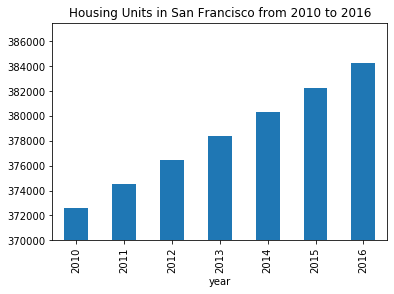

In [7]:
housing_units_per_year()

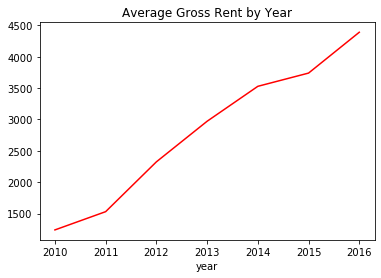

In [8]:
average_gross_rent()

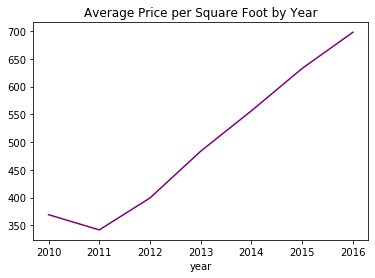

In [9]:
average_sales_price()

In [10]:
average_price_by_neighborhood()

,year,neighborhood,sale_price_sqr_foot
0,2010,Alamo Square,291.182945
1,2010,Anza Vista,267.932583
2,2010,Bayview,170.098665
3,2010,Buena Vista Park,347.394919
4,2010,Central Richmond,319.027623
...,...,...,...
392,2016,Telegraph Hill,903.049771
393,2016,Twin Peaks,970.085470
394,2016,Van Ness/ Civic Center,552.602567
395,2016,Visitacion Valley,328.319007


In [11]:
top_most_expensive_neighborhoods()

,neighborhood,sale_price_sqr_foot,housing_units,gross_rent
65,Union Square District,903.993258,377427.50,2555.166667
36,Merced Heights,788.844818,380348.00,3414.000000
38,Miraloma Park,779.810842,375967.25,2155.250000
51,Pacific Heights,689.555817,378401.00,2817.285714
71,Westwood Park,687.087575,382295.00,3959.000000
63,Telegraph Hill,676.506578,378401.00,2817.285714
57,Presidio Heights,675.350212,378401.00,2817.285714
10,Cow Hollow,665.964042,378401.00,2817.285714
56,Potrero Hill,662.013613,378401.00,2817.285714
60,South Beach,650.124479,375805.00,2099.000000


In [14]:
most_expensive_neighborhoods_rent_sales()

:DynamicMap   [neighborhood]
   :Bars   [year,Variable]   (value)

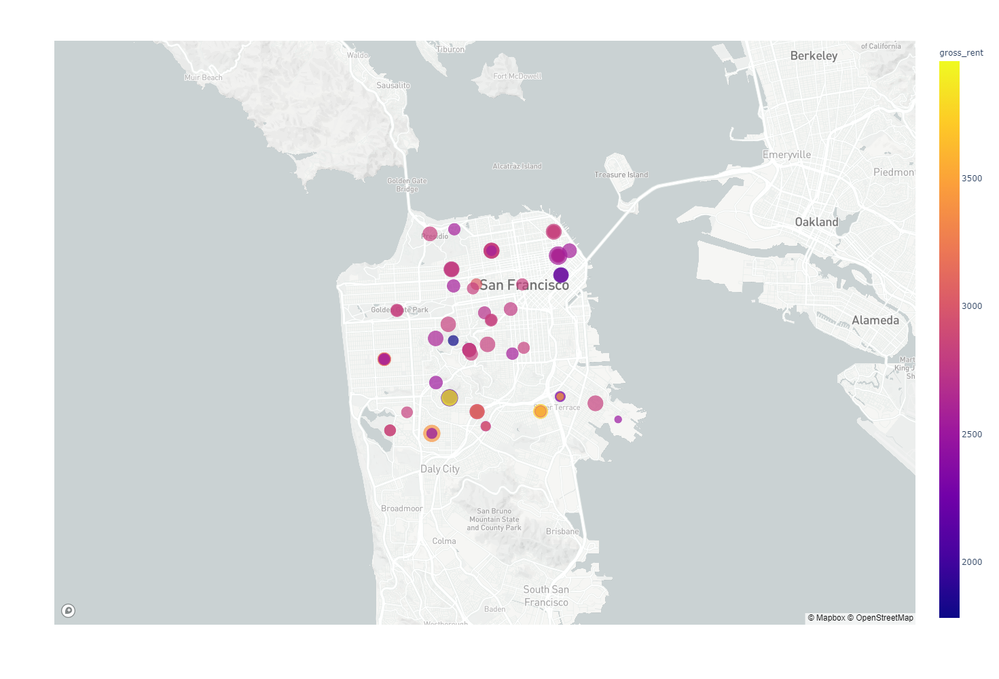

In [15]:
neighborhood_map()

In [16]:
parallel_categories()

<function __main__.parallel_categories()>

In [17]:
parallel_coordinates()

<function __main__.parallel_coordinates()>

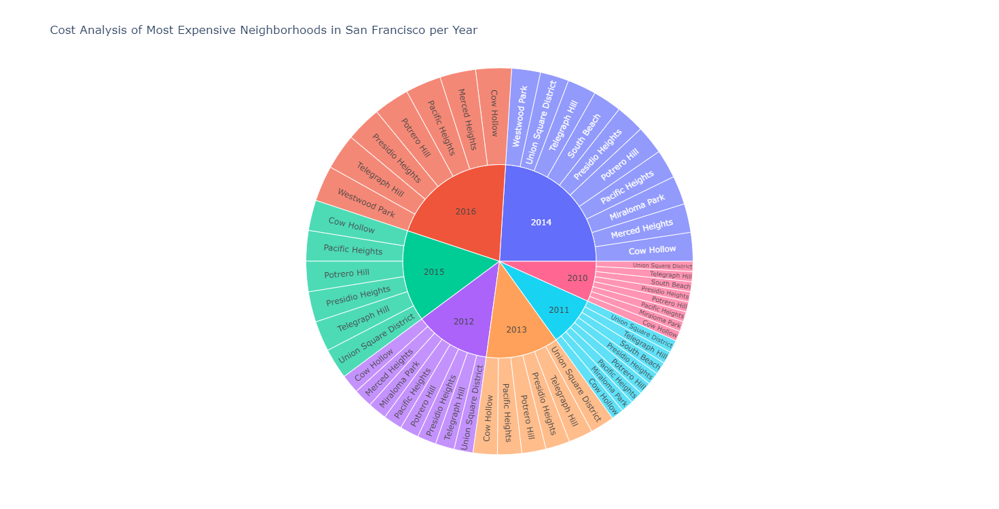

In [20]:
sunburst()